In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import data_xray.file_io as fio
from data_xray.nanonisio import Spectrum
from data_xray.report import QuickPPT
import numpy as np
import xarray as xr
import pandas as pd
import os
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared, RBF
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
import proplot as pplt

from pptx import Presentation
from pptx.util import Inches
import functools
import operator
import warnings
warnings.filterwarnings("ignore")

In [3]:
from read_nested import *

In [4]:
src_dir = ["/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221010_FeSe_1.2K/"]

In [474]:
root_folder = "/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/"
all_folders = [name for name in os.listdir(root_folder) if os.path.isdir(root_folder+name)]
pb_folders = [root_folder+name for name in all_folders if "Pb" in name]
fese_folders = [root_folder+name for name in all_folders if "FeSe" in name]
#fese_folders = [root_folder+name for name in fese_folders if "202203" in name]

In [475]:
fese_folders

['/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221005_FeSe_4.3K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221008_FeSe_11K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220221_FeSe_4.3K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221102_FeSe_1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220313_FeSe_1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220309_FeSe_1K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220526_FeSe_4.5K,1.2K_temp',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221027_FeSe_1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220803_FeSeTe_4.5K,1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220126_FeSe_4.3K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20220523_Cu(111)&FeSe_1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20221012_FeSe_1.2K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/20211222_FeSe_77K',
 '/Users/5nm/Dropbox (ORNL)/SangYong/00 JTSTMdata/202202

In [479]:
datFiles = []
#for _fese in fese_folders:
for fld in fese_folders:
    if '202203' in fld:
        df = fio.GetData.find_data(topdir=fld,ext='dat', get_data=True, header_only=True);
        datFiles.append(df)
    #[datFiles.append(d) for d in df if "Grid" in d]
datFiles = functools.reduce(operator.iconcat, datFiles, []);

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1342/1342 [00:00<00:00, 24047.63it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:00<00:00, 21901.42it/s]


In [480]:
c2 = fio.GetData.group_spectra(datFiles,3)
largesets = [c for c in c2 if len(c) > 10];

groups of spectra found
[9, 4, 4, 23, 4, 9, 9, 9, 9, 5, 9, 9, 9, 5, 9, 101, 9, 9, 161, 101, 81, 9, 81, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 14, 121, 6, 21, 12, 6, 4, 4, 22, 6, 21, 5, 52, 121, 10, 4, 41, 5, 21, 6, 16, 18, 16, 61, 5, 11, 4, 4, 5, 61, 76, 21, 161, 27, 43, 33, 29, 161, 161, 29, 10, 65, 161, 65, 34, 65, 29, 21, 41, 161, 65, 21, 41, 4, 61, 61, 14, 65, 161, 29, 65, 161, 65, 161, 29, 5, 65, 29, 65, 29, 29, 65, 65, 4, 31, 31, 31, 31, 11, 4, 33, 26, 11, 84, 31, 31, 22, 6, 31, 31, 34, 34, 51, 31, 51, 34, 5, 40, 34, 34, 11, 4, 5, 12, 33, 4, 6, 7, 11, 4, 5, 21, 6, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 5, 41, 12, 4, 4, 4, 4, 10, 4, 8, 7, 15, 15, 11, 27, 5, 6, 8, 6, 6]


In [481]:
len(largesets)

109

In [482]:
ppt1 = QuickPPT("pres1_202203.pptx")

trouble with z-sepctroscopy00009.dat
trouble with bias spectroscopy_00038.dat
trouble with IVz_vortexnear_00001.dat
trouble with bias_vortexnear1_2p_00001.dat
trouble with bias_vortexcore_2p_00001.dat
trouble with bias_spectroscopy_00010.dat
trouble with bias_pristine1_00001.dat
trouble with IVz_Pristine_200pm_00001.dat
trouble with z-spect_100pA_00001.dat
trouble with IVz_Vortex_200pm_00001.dat
trouble with IVz_Vortex2_200pm_00001.dat
trouble with bias spectroscopy00010.dat
trouble with bias spectroscopy00123.dat
trouble with bias spectroscopy00104.dat
trouble with dIdV_Test_100pA_150pm_00003.dat
trouble with z-spect_100pA_00001.dat
trouble with bias_spectroscopy_00084.dat
trouble with bias_spectroscopy_00001.dat
trouble with dIdV_test_200pm_00001.dat
trouble with IVz_line_twin_00001.dat
trouble with Bias_dIdV_pristine_260pm_00001.dat
trouble with Bias_spectroscopy_00007.dat
trouble with Bias_IVz_pristine_00001.dat
trouble with bias_IVz_Tvortex_core_00162.dat
trouble with IVz_line_twi

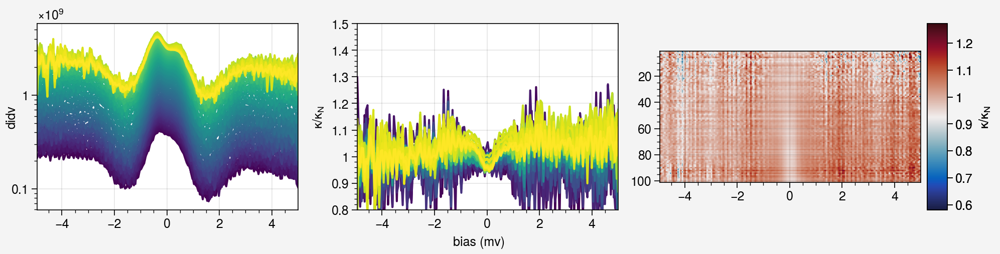

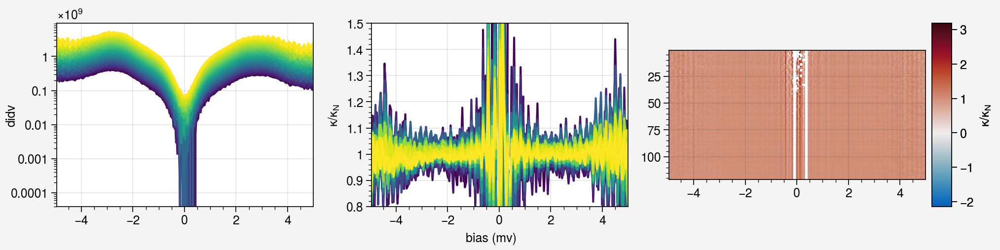

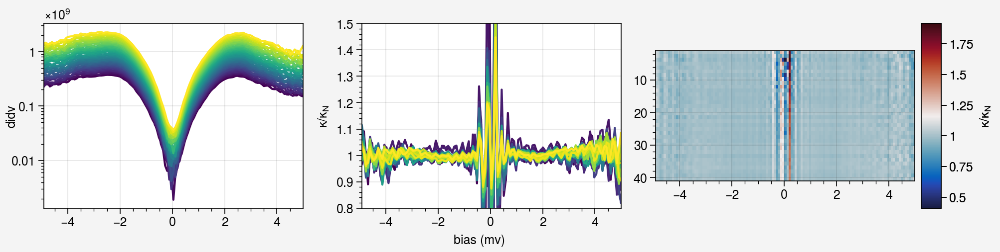

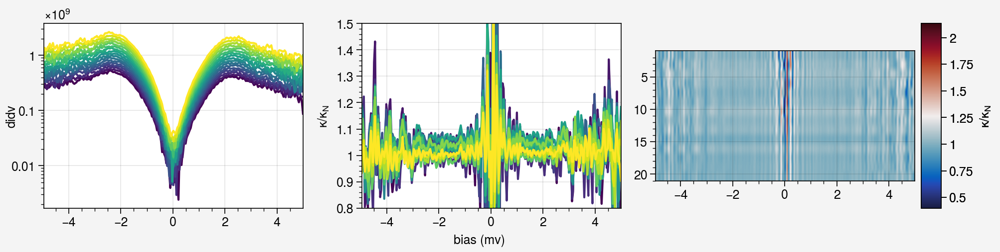

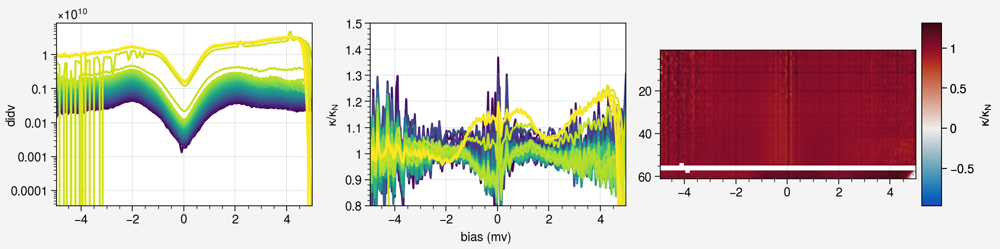

...

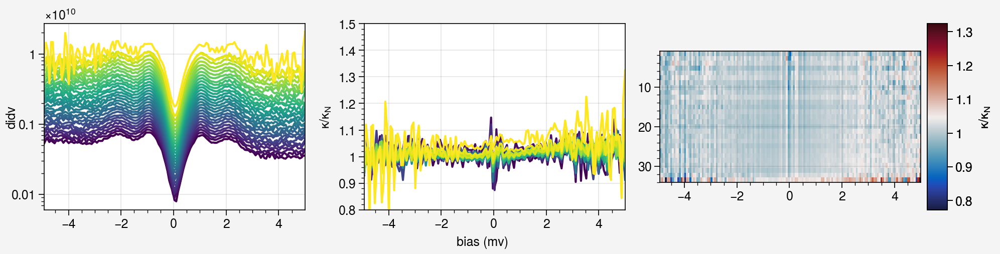

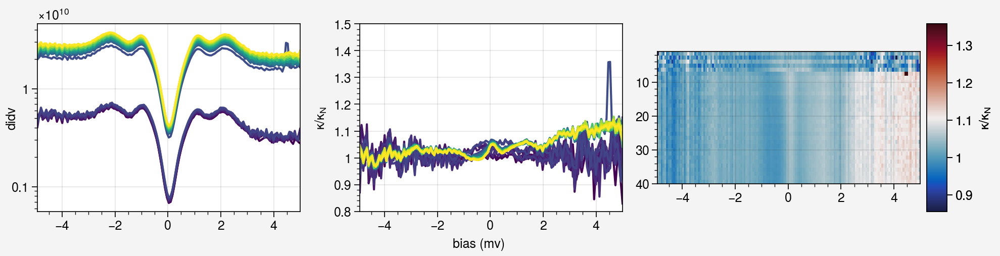

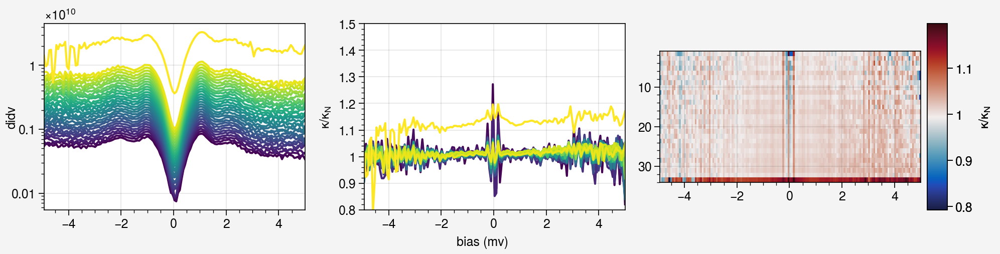

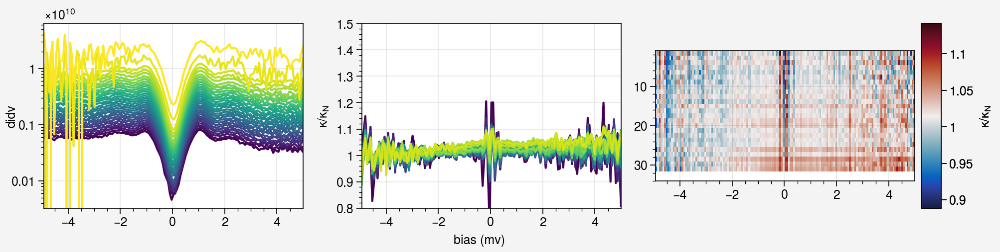

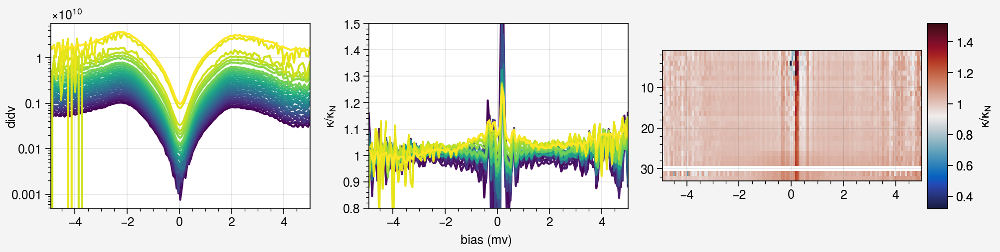

In [483]:
for _set in largesets:
    try:
        ref = 2
        init = 4

        _d =SinglePointXarray(_set).source
        _div = _d.di.data*1e10

        nspec = np.arange(len(_div[init:]))
        plum_cycle = pplt.Cycle("viridis",len(nspec),lw=1.5)


        f2,a2 = pplt.subplots(refwidth=2.6, ncols=3, sharey=False, refaspect=1.4)
        for iv in _div[init:]:
            a2[0].semilogy(_d.v,iv,cycle=plum_cycle)
            a2[0].set_xlabel("bias (mv)")
            a2[0].set_ylabel("didv",labelpad=-5)

        evec = [(np.log(aa)-np.log(_div[ref])+1) for aa in _div[init:]]


        for ee in evec:
            a2[1].plot(_d.v, ee/np.mean(ee[0:10]),cycle=plum_cycle)
            a2[1].set_xlabel("bias (mv)")
            a2[1].set_ylabel(r"$\kappa / \kappa_{N}$")
        a2[1].set_ylim([0.8,1.5])

        evec_norm = [_e/np.mean(_e[0:10]) for _e in evec[3:]]


        _tv = a2[2].imshow(np.array(evec_norm),cmap="balance",extent=[_d.v[0],_d.v[-1],len(_div),1],aspect=np.max(_d.v)/(len(_div)-1))
        _cbar = a2[2].colorbar(_tv, title=r"$\kappa / \kappa_{N}$")

        ppt1.pplt_to_ppt([f2],leftop=[[0.00,2.5]], txt=[_set[0].fname])
        ppt1.save()
    except:
        print("trouble with " + os.path.basename(_set[0].fname))

In [ ]:
'''devel floor below'''

In [14]:
rdg = DatGridXarray(datfiles=datFiles)

In [88]:
rdg.source

<xarray.Dataset>
Dimensions:  (xy: 49152, z: 1, bias: 127)
Coordinates:
  * bias     (bias) float64 -0.002953 -0.002906 -0.002858 ... 0.002953 0.003
  * z        (z) int64 0
  * xy       (xy) <U23 '-20.893E-9:110.324E-9' ... '6.55702E-9:116.159E-9'
Data variables:
    i        (xy, z, bias) float64 -4.87e-09 -4.809e-09 ... 3.422e-08 3.532e-08
    m1x      (xy, z, bias) float64 1.359e-10 1.286e-10 ... 1.089e-09 7.366e-10
    m1y      (xy, z, bias) float64 -8.489e-13 -3.679e-13 ... -1.069e-10
    m3x      (xy, z, bias) float64 6.925e-10 6.79e-10 ... -5.533e-09 -5.657e-09
    m3y      (xy, z, bias) float64 1.235e-12 2.161e-13 ... -7.672e-11 -6.165e-11

In [288]:
49152/128

384.0

In [296]:
kappa.data.squeeze().reshape(128,-1,127).shape

(128, 384, 127)

<a list of 1 Line2D objects>

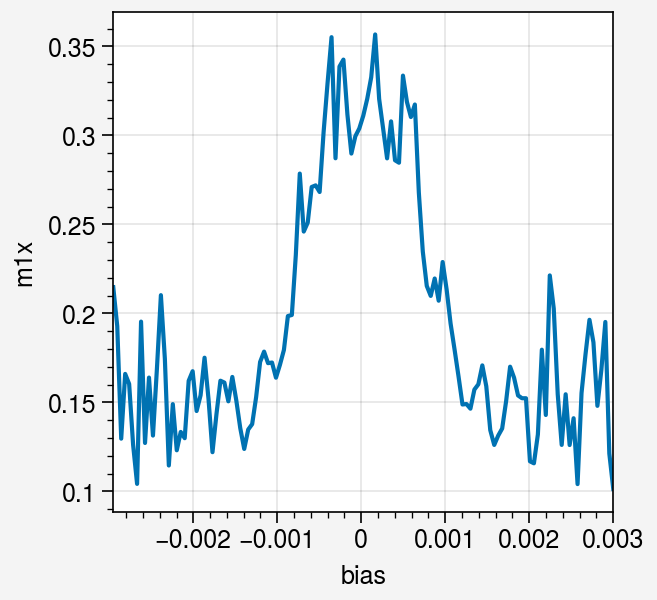

In [327]:
kappa = (-np.gradient(rdg.source.m3x,axis=-1)/rdg.source.m1x).squeeze()
kappaData = kappa.data.squeeze().reshape(128,-1,127)
f2,a2 = pplt.subplots()
a2.plot(kappa[500])

In [331]:
kappa_savgol = []
for j in np.arange(kappa.shape[0]):
    kappa_savgol.append(savgol_filter(kappa[j],15,polyorder=3,))

In [332]:
kappa_savgol = np.array(kappa_savgol)

<a list of 1 Line2D objects>

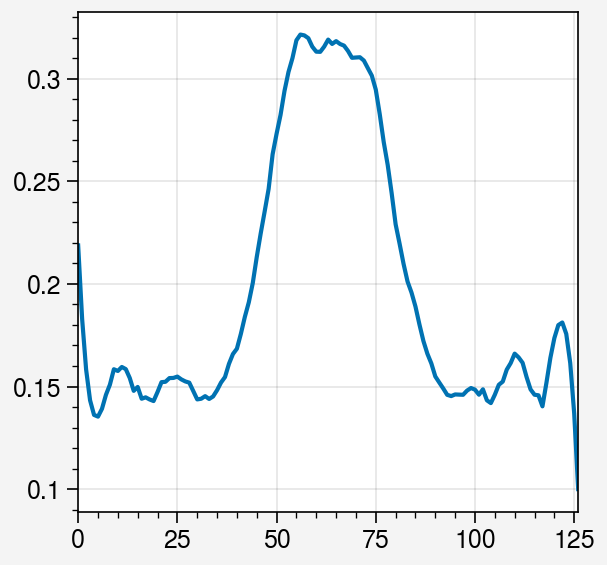

In [334]:
f2,a2 = pplt.subplots()
a2.plot(kappa_savgol[500])

In [339]:
from sklearn.decomposition import NMF
nmf = NMF(n_components=3, max_iter=500)

In [338]:
kappa_savgol.shape

(49152, 127)

In [342]:
W = nmf.fit_transform(np.abs(kappa_savgol))
H = nmf.components_

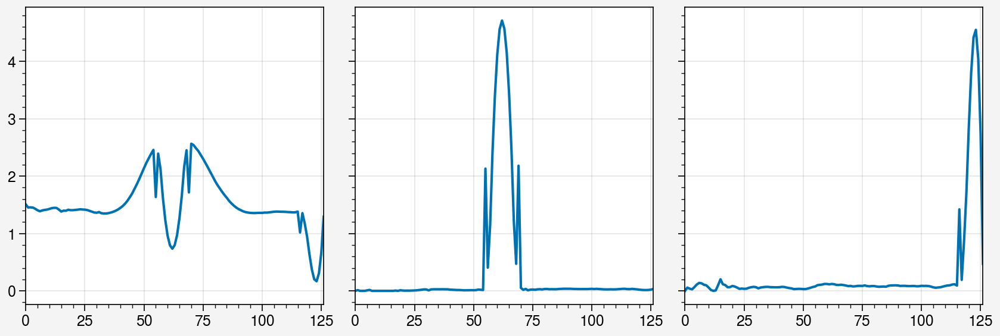

In [344]:
f2,a2 = pplt.subplots(ncols=H.shape[0])
for ia, a in enumerate(a2):
    a.plot(H[ia])

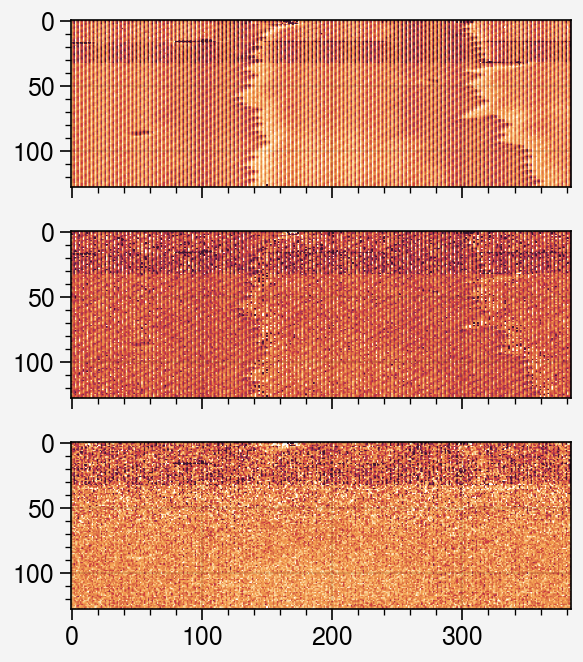

In [343]:
f2,a2 = pplt.subplots(nrows=W.shape[-1])
for ia, a in enumerate(a2):
    a.imshow(W[:,ia].reshape(128,-1), robust=True)

In [350]:
kappa_savgol.mean(axis=0)

array([0.12448566, 0.12331528, 0.12235606, 0.12158684, 0.12098644,
       0.12053371, 0.12020748, 0.1199866 , 0.11987742, 0.11976125,
       0.11962363, 0.11957137, 0.11963403, 0.11975507, 0.11979426,
       0.11973808, 0.11968321, 0.11962686, 0.11982093, 0.11991298,
       0.12006997, 0.12012862, 0.12009709, 0.12003749, 0.11991835,
       0.1197332 , 0.11939154, 0.11887868, 0.11823971, 0.11756819,
       0.11698307, 0.11646134, 0.11621316, 0.11605244, 0.11615348,
       0.11654332, 0.11725536, 0.11828616, 0.11959328, 0.12120103,
       0.12317478, 0.12569342, 0.12873205, 0.13244721, 0.13692945,
       0.14207036, 0.14799781, 0.1547351 , 0.16213165, 0.16994399,
       0.17785126, 0.18561215, 0.19305011, 0.1999409 , 0.20609796,
       0.21173571, 0.21587809, 0.21941702, 0.22220776, 0.22433898,
       0.22599706, 0.22718151, 0.22784732, 0.22806685, 0.22792245,
       0.22741066, 0.22650835, 0.22508173, 0.22318901, 0.22083419,
       0.21745403, 0.21390791, 0.20970102, 0.20495496, 0.19969

In [353]:
kappa.bias

<xarray.DataArray 'bias' (bias: 127)>
array([-2.952756e-03, -2.905512e-03, -2.858268e-03, -2.811024e-03,
       -2.763780e-03, -2.716536e-03, -2.669291e-03, -2.622047e-03,
       -2.574803e-03, -2.527559e-03, -2.480315e-03, -2.433071e-03,
       -2.385827e-03, -2.338583e-03, -2.291339e-03, -2.244094e-03,
       -2.196850e-03, -2.149606e-03, -2.102362e-03, -2.055118e-03,
       -2.007874e-03, -1.960630e-03, -1.913386e-03, -1.866142e-03,
       -1.818898e-03, -1.771653e-03, -1.724409e-03, -1.677165e-03,
       -1.629921e-03, -1.582677e-03, -1.535433e-03, -1.488189e-03,
       -1.440945e-03, -1.393701e-03, -1.346457e-03, -1.299213e-03,
       -1.251969e-03, -1.204724e-03, -1.157480e-03, -1.110236e-03,
       -1.062992e-03, -1.015748e-03, -9.685040e-04, -9.212599e-04,
       -8.740157e-04, -8.267716e-04, -7.795275e-04, -7.322836e-04,
       -6.850394e-04, -6.377953e-04, -5.905512e-04, -5.433071e-04,
       -4.960629e-04, -4.488188e-04, -4.015749e-04, -3.543308e-04,
       -3.070866e-04, -2.598425e-04, -2.125984e-04, -1.653542e-04,
       -1.181103e-04, -7.086620e-05, -2.362207e-05,  2.362207e-05,
        7.086620e-05,  1.181103e-04,  1.653545e-04,  2.125984e-04,
        2.598425e-04,  3.070866e-04,  3.543308e-04,  4.015749e-04,
        4.488190e-04,  4.960629e-04,  5.433071e-04,  5.905512e-04,
        6.377953e-04,  6.850394e-04,  7.322836e-04,  7.795277e-04,
        8.267716e-04,  8.740157e-04,  9.212601e-04,  9.685038e-04,
        1.015748e-03,  1.062992e-03,  1.110236e-03,  1.157480e-03,
        1.204724e-03,  1.251969e-03,  1.299213e-03,  1.346457e-03,
        1.393701e-03,  1.440945e-03,  1.488189e-03,  1.535433e-03,
        1.582677e-03,  1.629921e-03,  1.677165e-03,  1.724409e-03,
        1.771653e-03,  1.818898e-03,  1.866142e-03,  1.913386e-03,
        1.960630e-03,  2.007874e-03,  2.055118e-03,  2.102363e-03,
        2.149606e-03,  2.196850e-03,  2.244094e-03,  2.291339e-03,
        2.338583e-03,  2.385827e-03,  2.433071e-03,  2.480315e-03,
        2.527559e-03,  2.574803e-03,  2.622047e-03,  2.669292e-03,
        2.716536e-03,  2.763779e-03,  2.811023e-03,  2.858268e-03,
        2.905512e-03,  2.952756e-03,  3.000000e-03])
Coordinates:
  * bias     (bias) float64 -0.002953 -0.002906 -0.002858 ... 0.002953 0.003
    z        int64 0

In [359]:
kappa_savgol.shape

(49152, 127)

(128, 384, 127)

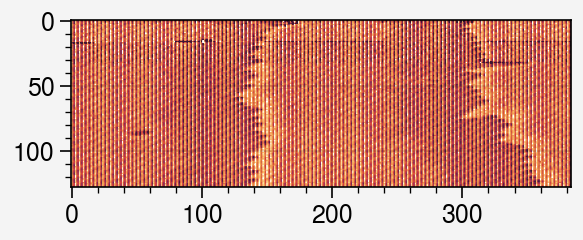

In [374]:
f2,a2 = pplt.subplots()
a2.imshow(kappa_savgol.reshape(128,-1,127)[:,:,49],robust=True)

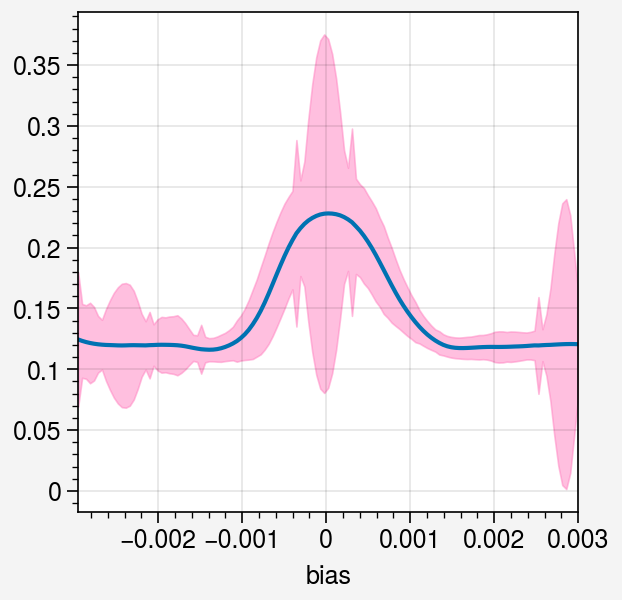

In [355]:
m =kappa_savgol.mean(axis=0)
std = kappa_savgol.std(axis=0)

f2,a2 = pplt.subplots()
a2.plot(kappa.bias,m)
a2.fill_between(kappa.bias,m+std,m-std, color='pink', alpha=0.5)

IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

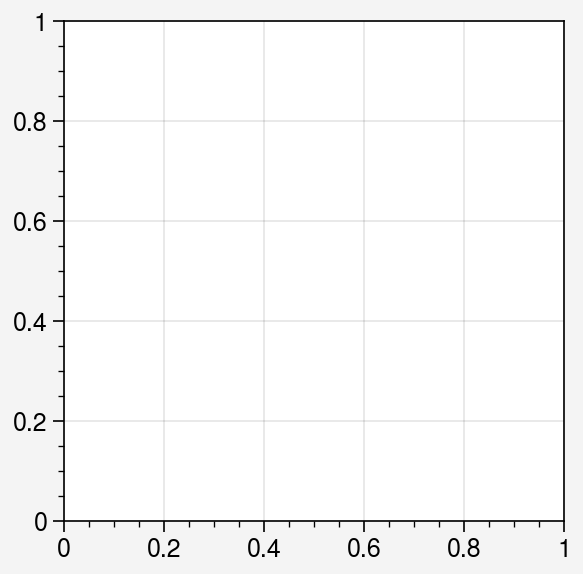

In [336]:
f2,a2 = pplt.subplots()

In [314]:
kappa.data.squeeze().shape

(49152, 127)

In [318]:
a2.imshow(kappa_savgol[:,:,51],robust=True)


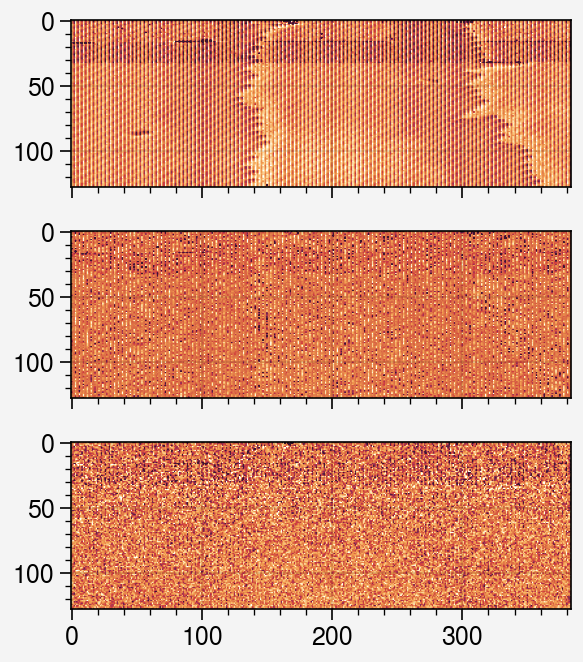

In [321]:
f2,a2 = pplt.subplots(nrows=W.shape[-1])
for ia, a in enumerate(a2):
    a.imshow(W[:,ia].reshape(128,-1), robust=True)

In [323]:
H.shape

(3, 127)

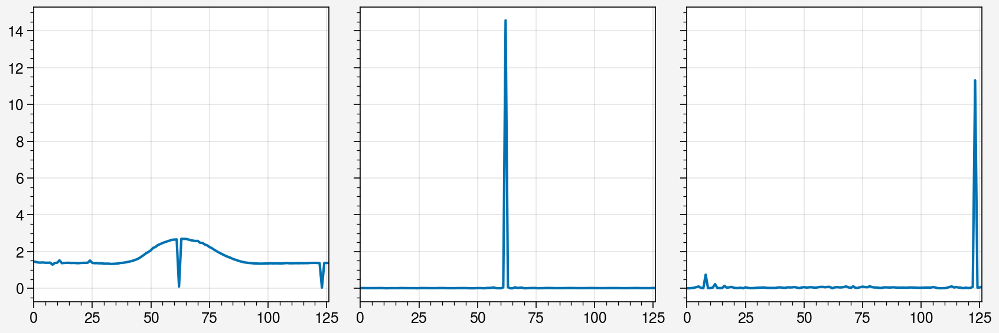

In [324]:
f2,a2 = pplt.subplots(ncols=H.shape[0])
for ia, a in enumerate(a2):
    a.plot(H[ia])

<a list of 1 Line2D objects>

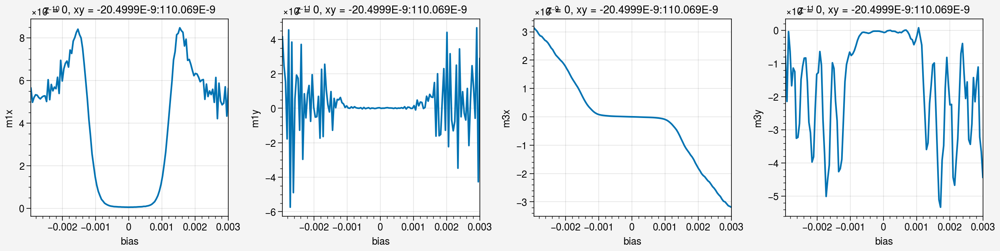

In [95]:
f2,a2 = pplt.subplots(ncols=4,share=False)
rdg.source.m1x[10,0].plot(ax=a2[0])
rdg.source.m1y[10,0].plot(ax=a2[1])
rdg.source.m3x[10,0].plot(ax=a2[2])
rdg.source.m3y[10,0].plot(ax=a2[3])


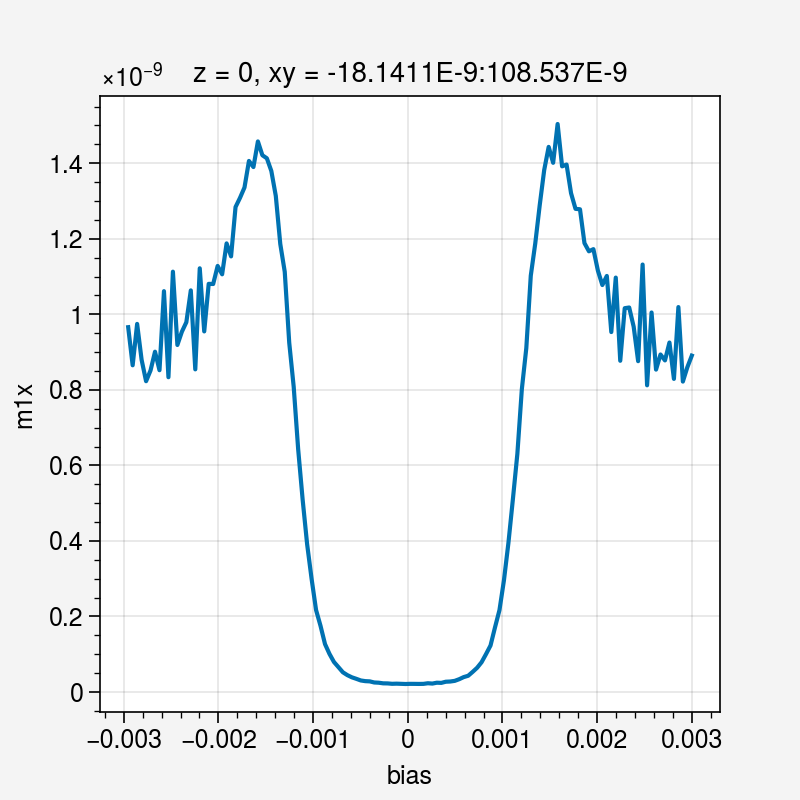

In [107]:
rdg.source.m1x[ind,0].plot()

In [111]:
rdg.source.m3x[ind,0].data

array([ 6.0853673e-09,  5.9152168e-09,  5.8164251e-09,  5.6237277e-09,
        5.4481450e-09,  5.3346794e-09,  5.2185354e-09,  5.1517119e-09,
        5.0543112e-09,  4.9519002e-09,  4.8301754e-09,  4.7002722e-09,
        4.6192259e-09,  4.4744963e-09,  4.2960862e-09,  4.1849120e-09,
        4.0345149e-09,  3.8607282e-09,  3.6975025e-09,  3.5702175e-09,
        3.4086709e-09,  3.1926595e-09,  3.1013314e-09,  3.0030758e-09,
        2.8215077e-09,  2.6706997e-09,  2.5045419e-09,  2.3167674e-09,
        2.0717048e-09,  1.8465944e-09,  1.6570383e-09,  1.4506762e-09,
        1.2769188e-09,  1.1431754e-09,  9.9853226e-10,  8.5041263e-10,
        7.0900674e-10,  5.8572036e-10,  4.7320914e-10,  3.8203557e-10,
        3.1884900e-10,  2.6566685e-10,  2.2821732e-10,  1.9641340e-10,
        1.7116088e-10,  1.4953612e-10,  1.3052191e-10,  1.1765280e-10,
        1.0476706e-10,  9.4212936e-11,  8.6757240e-11,  7.7209683e-11,
        6.8418417e-11,  6.1183177e-11,  5.3544801e-11,  4.5713523e-11,
      

<a list of 1 Line2D objects>

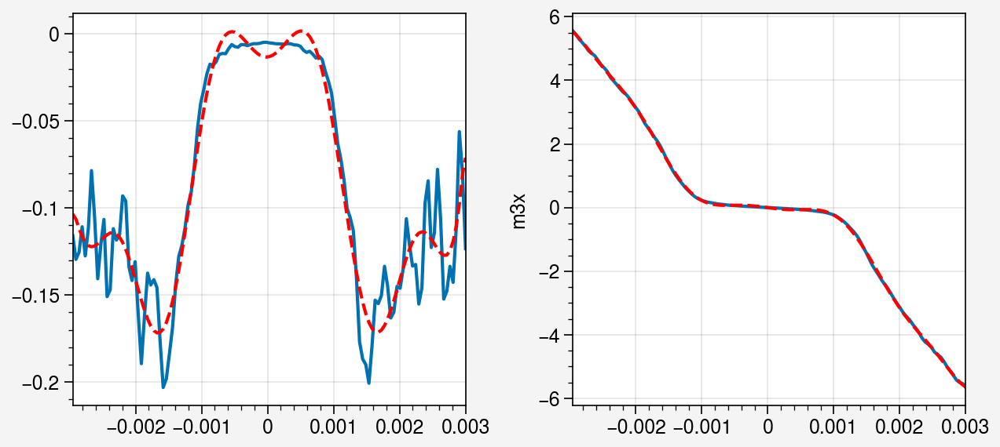

In [202]:
ind=-1
dat = rdg.source.m3x[ind,0]/1e-9

f2,a2 = pplt.subplots(ncols=2, share=False)
a2[0].plot(dat.bias.data,np.gradient(dat))

xx = np.vstack(dat.bias.data)[::1]
yy = dat.data[::1]
gp_kernel =  RBF(length_scale_bounds=(0.0015,1.0)) #+ WhiteKernel(noise_level_bounds=(0.062,1.))
gpr = GaussianProcessRegressor(kernel=gp_kernel)
gpr.fit(xx,yy)
gpr_pred1, gpr_std1 = gpr.predict(xx, return_std=True)


a2[0].plot(xx,np.gradient(gpr_pred1),'r--')

a2[1].plot(dat.bias.data,dat)
a2[1].plot(xx,gpr_pred1,'r--')


<a list of 1 Line2D objects>

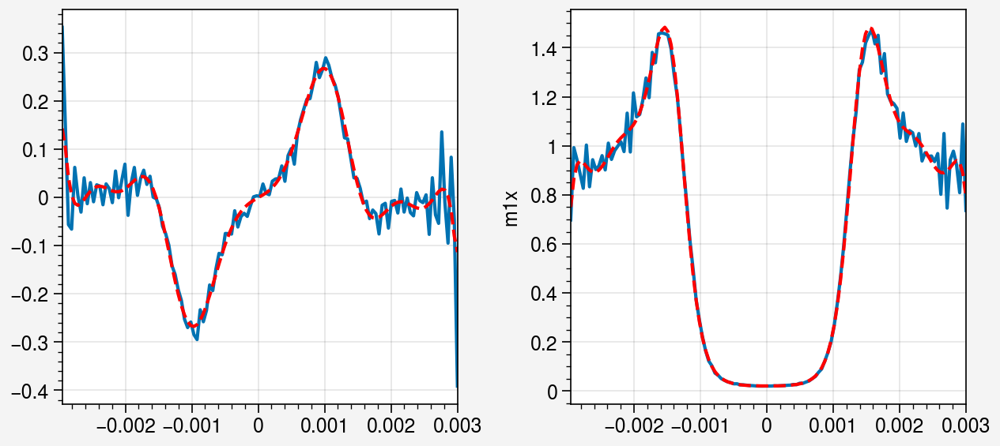

In [181]:
ind=-1
dat = rdg.source.m1x[ind,0]/1e-9
dat = np.log(dat)

f2,a2 = pplt.subplots(ncols=2, share=False)
a2[0].plot(dat.bias.data,np.gradient(dat))

xx = np.vstack(dat.bias.data)[::1]
yy = dat.data[::1]
gp_kernel =  RBF(length_scale_bounds=(0.001,5.))# + WhiteKernel(noise_level_bounds=(0.00001,10.))
gpr = GaussianProcessRegressor(kernel=gp_kernel)
gpr.fit(xx,yy)
gpr_pred, gpr_std = gpr.predict(xx, return_std=True)


a2[0].plot(xx,np.gradient(gpr_pred),'r--')

a2[1].plot(dat.bias.data,np.exp(dat))
a2[1].plot(xx,np.exp(gpr_pred),'r--')

In [204]:
from scipy.signal import savgol_filter

<a list of 1 Line2D objects>

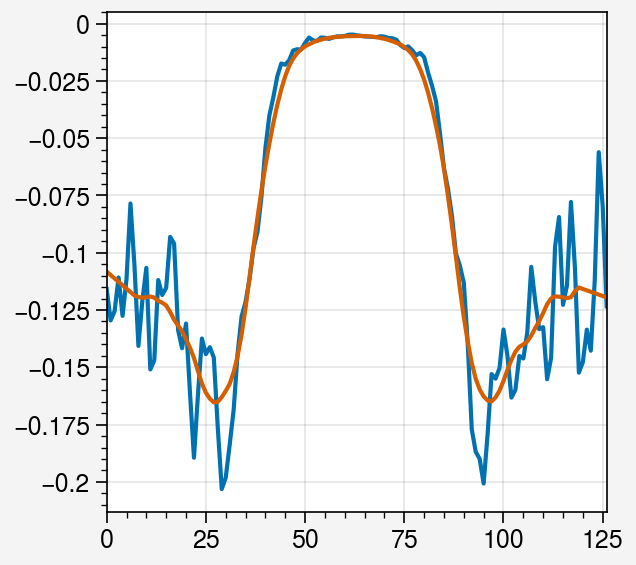

In [215]:
f3,a3 = pplt.subplots()
a3.plot(np.gradient(rdg.source.m3x[ind,0]/1e-9))
a3.plot(savgol_filter(rdg.source.m3x[ind,0]/1e-9,15,polyorder=2,deriv=1))

<a list of 1 Line2D objects>

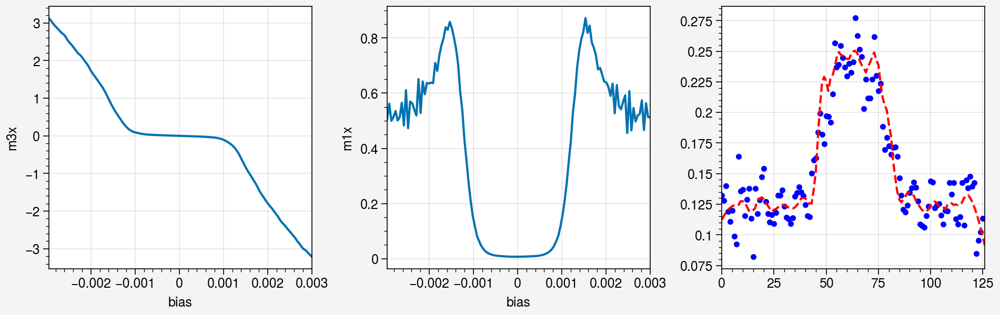

In [246]:
ind=55
f2,a2 = pplt.subplots(ncols=3,share=False)
a2[0].plot(rdg.source.m3x[ind,0]/1e-9)
a2[1].plot(rdg.source.m1x[ind,0]/1e-9)
a2[2].plot(-np.gradient(rdg.source.m3x[ind,0].data/1e-9)/(rdg.source.m1x[ind,0].data/1e-9),'b.')
a2[2].plot(-savgol_filter(rdg.source.m3x[ind,0]/1e-9,17,polyorder=3,deriv=1)/(savgol_filter(rdg.source.m1x[ind,0]/1e-9,17,polyorder=3,deriv=0)),'r--')

<a list of 1 Line2D objects>

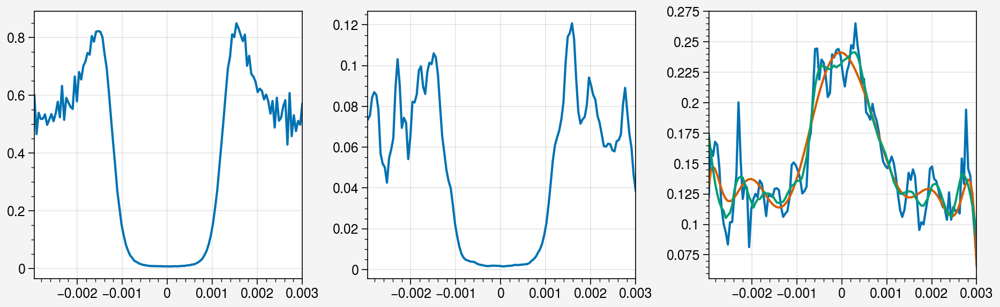

In [278]:
ind=25
denom = (rdg.source.m1x[ind,0]/1e-9).data
enum = -1*np.gradient((rdg.source.m3x[ind,0]/1e-9).data)
xx = np.vstack(rdg.source.m1x[ind,0].bias.data)

f2,a2 = pplt.subplots(ncols=3, share=False)
a2[0].plot(xx,denom)
a2[1].plot(xx,enum)
a2[2].plot(xx,enum/denom)

gp_kernel =  RBF(length_scale_bounds=(0.0015,2.0))# + WhiteKernel(noise_level_bounds=(0.01,1.))
gpr = GaussianProcessRegressor(kernel=gp_kernel)
gpr.fit(xx[::2],(enum/denom)[::2])
gpr_pred, gpr_std = gpr.predict(xx, return_std=True)
a2[2].plot(xx,gpr_pred)
a2[2].plot(xx,savgol_filter(enum/denom,15,polyorder=2))

<a list of 1 Line2D objects>

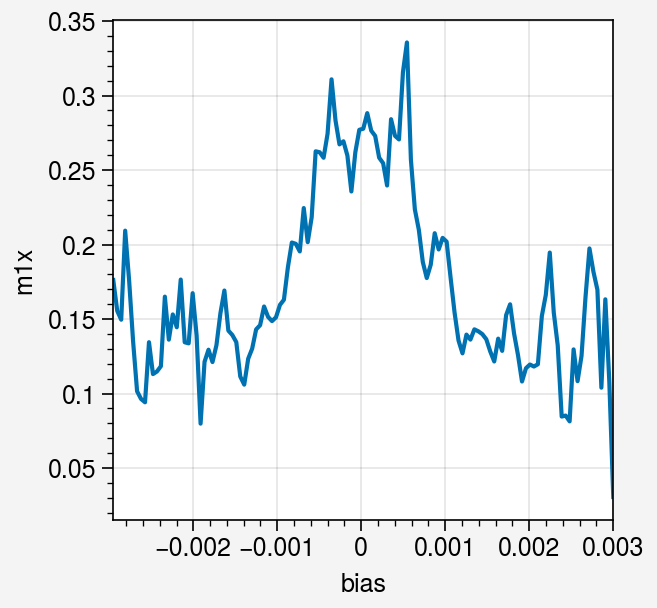

In [105]:
ind = 65
f2,a2 = pplt.subplots()
a2.plot(-np.gradient(rdg.source.m3x[ind,0])/rdg.source.m1x[ind,0])